A project on Drug Quality detection at the dispatching phase at manufacturing unit

---


> Now go to Runtime > Change Runtime Type and make sure to select GPU as Hardware accelerator.




Check which GPU you want to train on as Collab provides different varients of GPU

In [1]:
!nvidia-smi

Tue Dec  7 04:54:51 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.44       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   43C    P0    27W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
!pip install tensorflow==2.4 

In [3]:
!pip install tensorflow-datasets==4.0.0

In [4]:
!pip install keras==2.4.3

In [5]:
!pip list

Package                       Version
----------------------------- --------------
absl-py                       0.12.0
alabaster                     0.7.12
albumentations                0.1.12
altair                        4.1.0
apache-beam                   2.35.0rc2
appdirs                       1.4.4
argcomplete                   1.12.3
argon2-cffi                   21.1.0
arviz                         0.11.4
astor                         0.8.1
astropy                       4.3.1
astunparse                    1.6.3
atari-py                      0.2.9
atomicwrites                  1.4.0
attrs                         21.2.0
audioread                     2.1.9
autograd                      1.3
avro-python3                  1.10.2
Babel                         2.9.1
backcall                      0.2.0
beautifulsoup4                4.6.3
bleach                        4.1.0
blis                          0.4.1
bokeh                         2.3.3
Bottleneck                    1.3.2
branca 

In [6]:
%tensorflow_version 2.4

`%tensorflow_version` only switches the major version: 1.x or 2.x.
You set: `2.4`. This will be interpreted as: `2.x`.


TensorFlow 2.x selected.


In [7]:
import tensorflow as tf
tf.test.is_gpu_available()


Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


True

In [8]:
tf.__version__

'2.4.0'

In [9]:
!nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Mon_Oct_12_20:09:46_PDT_2020
Cuda compilation tools, release 11.1, V11.1.105
Build cuda_11.1.TC455_06.29190527_0


###Mount the drive to proceed further 

In [10]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [11]:
%cd /content/gdrive/MyDrive/Tensorflow2_Model/models_tf24

/content/gdrive/MyDrive/Tensorflow2_Model/models_tf24


In [12]:
!apt-get install protobuf-compiler python-pil python-lxml python-tk
!pip install Cython

Reading package lists... Done
Building dependency tree       
Reading state information... Done
protobuf-compiler is already the newest version (3.0.0-9.1ubuntu1).
python-lxml is already the newest version (4.2.1-1ubuntu0.4).
python-pil is already the newest version (5.1.0-1ubuntu0.6).
python-tk is already the newest version (2.7.17-1~18.04).
0 upgraded, 0 newly installed, 0 to remove and 37 not upgraded.


In [13]:
%cd /content/gdrive/MyDrive/Tensorflow2_Model/models_tf24/research
!protoc object_detection/protos/*.proto --python_out=.

/content/gdrive/MyDrive/Tensorflow2_Model/models_tf24/research


In [14]:
import os
os.environ['PYTHONPATH'] += ':/content/gdrive/My Drive/Desktop/models/research/:/content/gdrive/My Drive/Desktop/models/research/slim'

Always run the cell below for every session restart

In [15]:
!python setup.py build
!python setup.py install

running build
running build_py
copying object_detection/protos/anchor_generator_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/box_coder_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/argmax_matcher_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/box_predictor_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/bipartite_matcher_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/calibration_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/center_net_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/eval_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/faster_rcnn_box_coder_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/fpn_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/faster_rcnn_pb2.py -> build/lib/object_detection/

Check thr remaining time allowed for the session you are runing. Depending on your data try to know the number of hours that will be enough. If the time is lesser then restart the session. NB the time result you see in in hours

In [16]:
import time, psutil
Start = time.time()- psutil.boot_time()
Left= 12*3600 - Start
print('Time remaining for this session is: ', Left/3600)

Time remaining for this session is:  10.569116285045942


Run Code below to see if all we need for the training has been installed.

In [17]:
#rember the last CD you did in order to specify the directory.
%cd /content/gdrive/MyDrive/Tensorflow2_Model/models_tf24/research/object_detection/builders
!python model_builder_test.py

/content/gdrive/My Drive/Tensorflow2_Model/models_tf24/research/object_detection/builders
2021-12-07 04:55:44.529838: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0


Change Directory to object detection folder

In [18]:
%cd /content/gdrive/MyDrive/Tensorflow2_Model/models_tf24/research/object_detection

/content/gdrive/MyDrive/Tensorflow2_Model/models_tf24/research/object_detection


Run the cell below to generate your CSV file or you can just run 
!python xml_to_csv.py so no need to copy the entire code 

```
# This is formatted as code
```






In [19]:
import os
import glob
import pandas as pd
import xml.etree.ElementTree as ET


def xml_to_csv(path):
    xml_list = []
    for xml_file in glob.glob(path + '/*.xml'):
        tree = ET.parse(xml_file)
        root = tree.getroot()
        for member in root.findall('object'):
            value = (root.find('filename').text,
                     int(root.find('size')[0].text),
                     int(root.find('size')[1].text),
                     member[0].text,
                     int(member[4][0].text),
                     int(member[4][1].text),
                     int(member[4][2].text),
                     int(member[4][3].text)
                     )
            xml_list.append(value)
    column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']
    xml_df = pd.DataFrame(xml_list, columns=column_name)
    return xml_df


def main():
    for folder in ['train','test']:
        image_path = os.path.join(os.getcwd(), ('images/' + folder))
        xml_df = xml_to_csv(image_path)
        xml_df.to_csv(('images/' + folder + '.csv'), index=None)
        print('Successfully converted xml to csv.')


main()


Successfully converted xml to csv.
Successfully converted xml to csv.


Create a python file named generate_tfrecord.py then edit the lables and run the commands to generate train and test records
```
"""
Usage:
  # Create train data:
  python generate_tfrecord.py --csv_input=images/train.csv --image_dir=images/train --output_path=train.record

  # Create test data:
  python generate_tfrecord.py --csv_input=images/test.csv  --image_dir=images/test --output_path=test.record
"""


###generate the train record

In [20]:
!python generate_tfrecord.py --csv_input=images/train.csv --image_dir=images/train --output_path=train.record

2021-12-07 04:55:49.286048: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
Successfully created the TFRecords: /content/gdrive/My Drive/Tensorflow2_Model/models_tf24/research/object_detection/train.record


###generate the test record

In [21]:
!python generate_tfrecord.py --csv_input=images/test.csv  --image_dir=images/test --output_path=test.record

2021-12-07 04:55:54.134264: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
Successfully created the TFRecords: /content/gdrive/My Drive/Tensorflow2_Model/models_tf24/research/object_detection/test.record


Get the pre-trained Object detection model

You can simply copy the code of pretrained model config file and edit the hyperparameters as you need.Below is how the config file of faster_rcnn_inception_resnet_v2_1024x1024_coco17_tpu-8 model looks like :

```
# Faster R-CNN with Resnet-152 (v2)
# w/high res inputs, long training schedule
# Trained on COCO, initialized from Imagenet classification checkpoint
#
model {
  faster_rcnn {
    num_classes: 4
    image_resizer {
      keep_aspect_ratio_resizer {
        min_dimension: 600
        max_dimension: 1024
        pad_to_max_dimension: true
      }
    }
    feature_extractor {
      type: 'faster_rcnn_inception_resnet_v2_keras'
    }
    first_stage_anchor_generator {
      grid_anchor_generator {
        scales: [0.25, 0.5, 1.0, 2.0]
        aspect_ratios: [0.5, 1.0, 2.0]
        height_stride: 16
        width_stride: 16
      }
    }
    first_stage_box_predictor_conv_hyperparams {
      op: CONV
      regularizer {
        l2_regularizer {
          weight: 0.0
        }
      }
      initializer {
        truncated_normal_initializer {
          stddev: 0.01
        }
      }
    }
    first_stage_nms_score_threshold: 0.0
    first_stage_nms_iou_threshold: 0.7
    first_stage_max_proposals: 300
    first_stage_localization_loss_weight: 2.0
    first_stage_objectness_loss_weight: 1.0
    initial_crop_size: 17
    maxpool_kernel_size: 1
    maxpool_stride: 1
    second_stage_box_predictor {
      mask_rcnn_box_predictor {
        use_dropout: false
        dropout_keep_probability: 1.0
        fc_hyperparams {
          op: FC
          regularizer {
            l2_regularizer {
              weight: 0.0
            }
          }
          initializer {
            variance_scaling_initializer {
              factor: 1.0
              uniform: true
              mode: FAN_AVG
            }
          }
        }
      }
    }
    second_stage_post_processing {
      batch_non_max_suppression {
        score_threshold: 0.0
        iou_threshold: 0.6
        max_detections_per_class: 100
        max_total_detections: 100
      }
      score_converter: SOFTMAX
    }
    second_stage_localization_loss_weight: 2.0
    second_stage_classification_loss_weight: 1.0
  }
}

train_config: {
  batch_size: 2
  num_steps: 10000
  optimizer {
    momentum_optimizer: {
      learning_rate: {
        cosine_decay_learning_rate {
          learning_rate_base: 0.008
          total_steps: 10000
          warmup_learning_rate: 0.0008
          warmup_steps: 50
        }
      }
      momentum_optimizer_value: 0.9
    }
    use_moving_average: false
  }
  gradient_clipping_by_norm: 10.0
  fine_tune_checkpoint_version: V2
  fine_tune_checkpoint: "/content/gdrive/MyDrive/Tensorflow2_Model/models_tf24/research/object_detection/faster_rcnn_inception_resnet_v2_1024x1024_coco17_tpu-8/checkpoint/ckpt-0"
  fine_tune_checkpoint_type: "detection"
  data_augmentation_options {
    random_horizontal_flip {
    }
  }
}
train_input_reader: {
  label_map_path: "/content/gdrive/MyDrive/Tensorflow2_Model/models_tf24/research/object_detection/object_detection/training/label_map.pbtxt"
  tf_record_input_reader {
    input_path: "/content/gdrive/MyDrive/Tensorflow2_Model/models_tf24/research/object_detection/train.record"
  }
}

eval_config: {
  metrics_set: "coco_detection_metrics"
  use_moving_averages: false
  batch_size: 1;
}

eval_input_reader: {
  label_map_path: "/content/gdrive/MyDrive/Tensorflow2_Model/models_tf24/research/object_detection/training/labelmap.pbtxt"
  shuffle: false
  num_epochs: 1
  tf_record_input_reader {
  input_path: "/content/gdrive/MyDrive/Tensorflow2_Model/models_tf24/research/object_detection/test.record"
  }
}
'''


Create a file called label_map.pbtxt and then define the classes in a dictionary format as shown below 

item {
  id: 1
  name: 'Tablet_Presence'
}

item {
  id: 2
  name: 'Tablet_Absence'
}

item {
  id: 3
  name: 'Good_Sealing'
}

item {
  id: 4
  name: 'Bad_Sealing'
}

ALWAYS CHECK TIME

In [22]:
import time, psutil
Start = time.time()- psutil.boot_time()
Left= 12*3600 - Start
print('Time remaining for this session is: ', Left/3600)

Time remaining for this session is:  10.565552047954665


In [23]:
%cd /content/gdrive/MyDrive/Tensorflow2_Model/models_tf24/research/object_detection

/content/gdrive/MyDrive/Tensorflow2_Model/models_tf24/research/object_detection


#Visualizing or Monitoring the training loss with respect to change in learning rate 
Install Tensorboard to see the changes visually

In [24]:
pip install tensorboardcolab

In [33]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


##Training 
Start the training by running the below command 

```

```



In [36]:
!python model_main_tf2.py  --pipeline_config_path=training/faster_rcnn_inception_resnet_v2_1024x1024_coco17_tpu-8.config --model_dir=training --alsologtostderr

2021-12-07 05:20:25.160954: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
2021-12-07 05:20:28.484225: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2021-12-07 05:20:28.485114: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2021-12-07 05:20:28.490418: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-12-07 05:20:28.491294: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla P100-PCIE-16GB computeCapability: 6.0
coreClock: 1.3285GHz coreCount: 56 deviceMemorySize: 15.90GiB deviceMemoryBandwidth: 681.88GiB/s
2021-12-07 05:20:28.491344: I tensorflow/stream_executor/platform/def

In [38]:
%reload_ext tensorboard

In [41]:
%tensorboard --logdir training/

Reusing TensorBoard on port 6007 (pid 3231), started 0:24:48 ago. (Use '!kill 3231' to kill it.)

<IPython.core.display.Javascript object>

##Exporting Inference Graph

In [42]:
!python exporter_main_v2.py --trained_checkpoint_dir=training --output_directory=inference_graph_14k --pipeline_config_path=training/faster_rcnn_inception_resnet_v2_1024x1024_coco17_tpu-8.config

2021-12-07 05:42:50.647858: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
2021-12-07 05:42:53.584981: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2021-12-07 05:42:53.585932: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2021-12-07 05:42:53.591347: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-12-07 05:42:53.592338: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla P100-PCIE-16GB computeCapability: 6.0
coreClock: 1.3285GHz coreCount: 56 deviceMemorySize: 15.90GiB deviceMemoryBandwidth: 681.88GiB/s
2021-12-07 05:42:53.592373: I tensorflow/stream_executor/platform/def

#LETS TEST OUR MODEL AND SEE RESULT





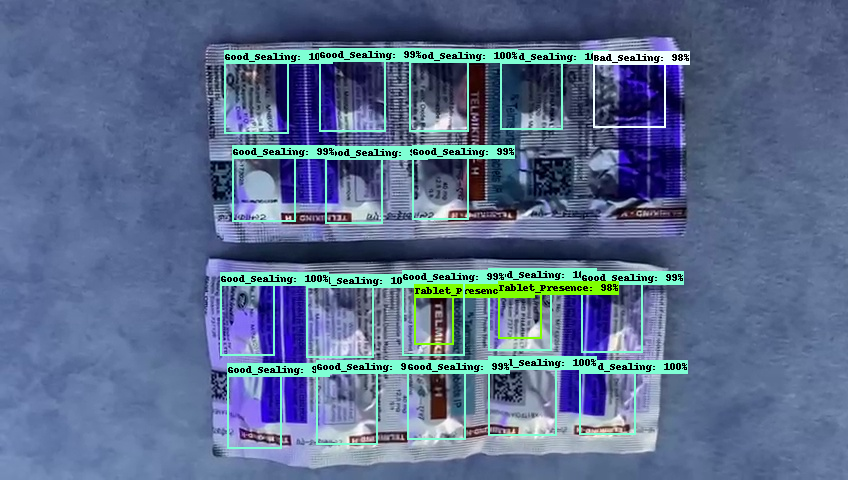

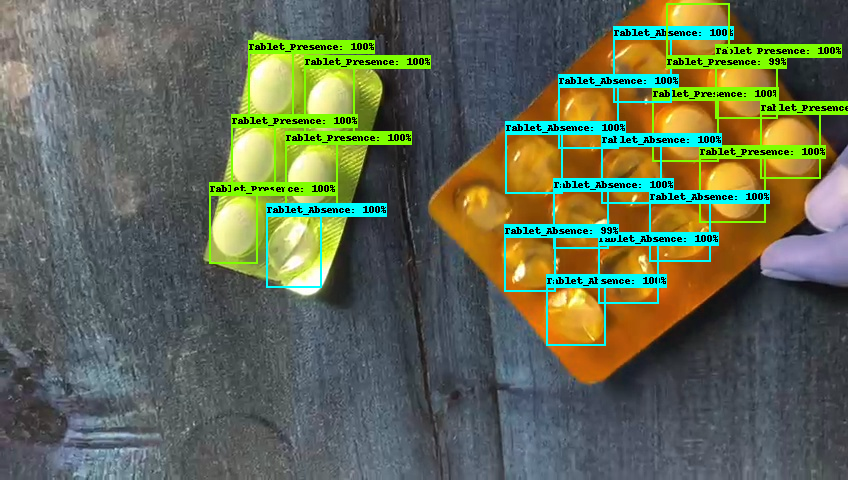

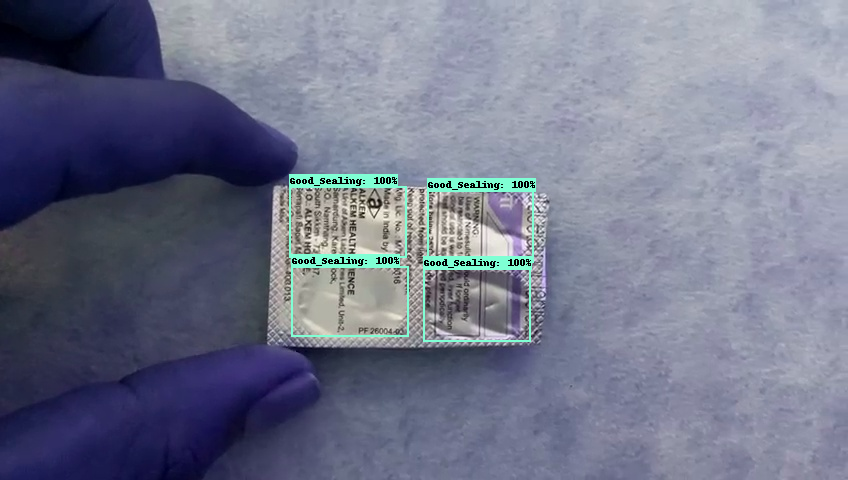

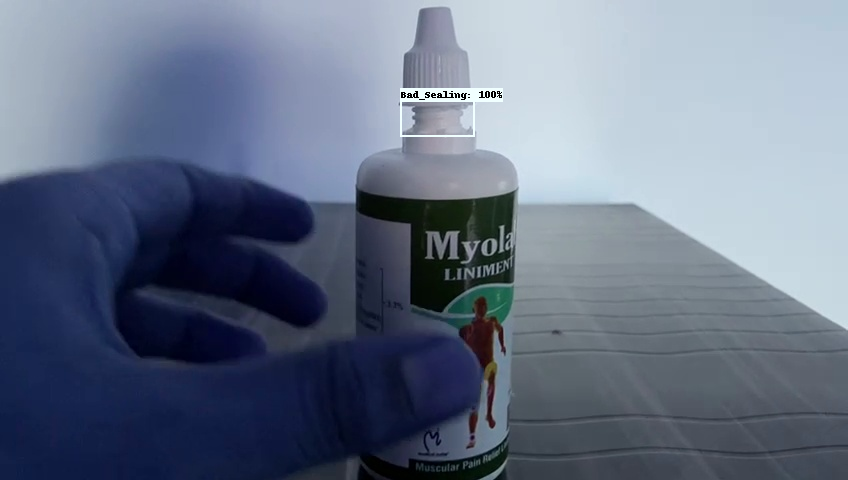

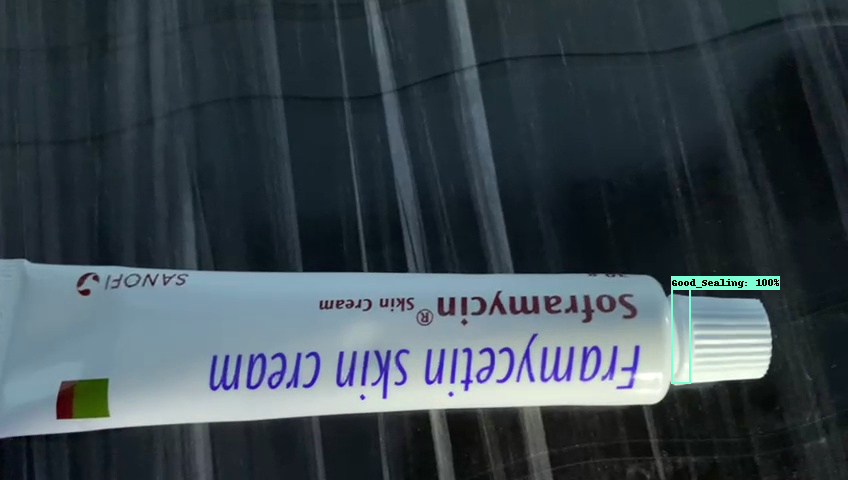

...

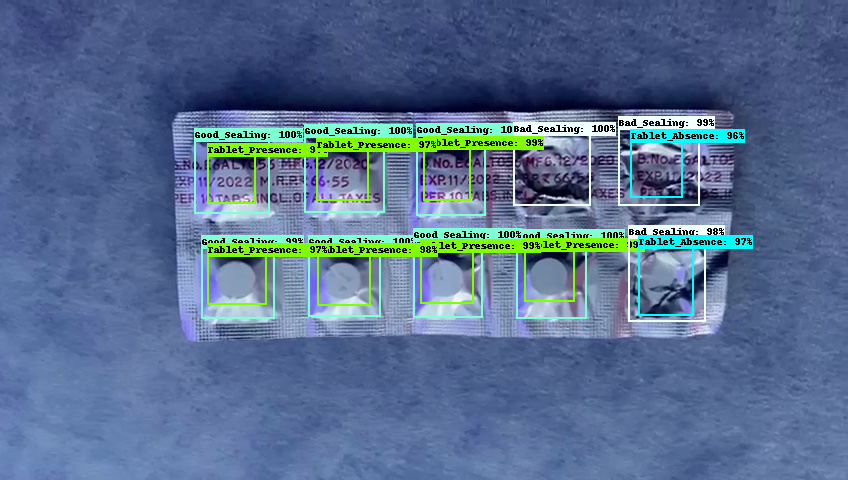

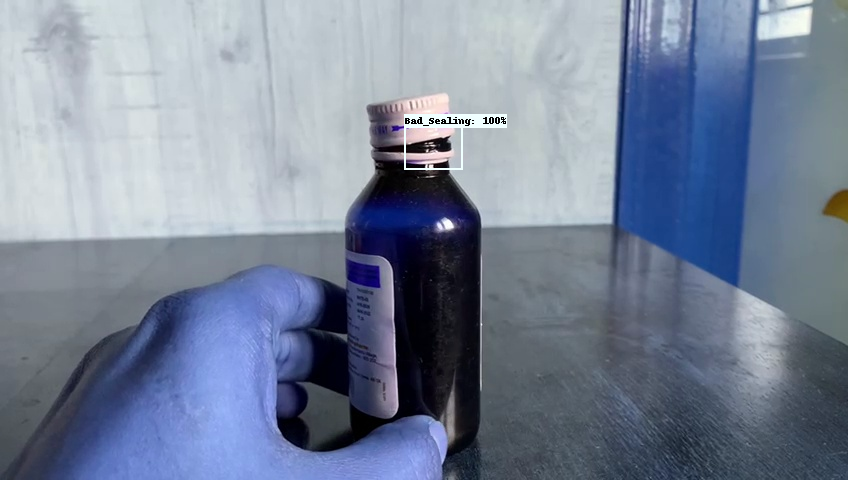

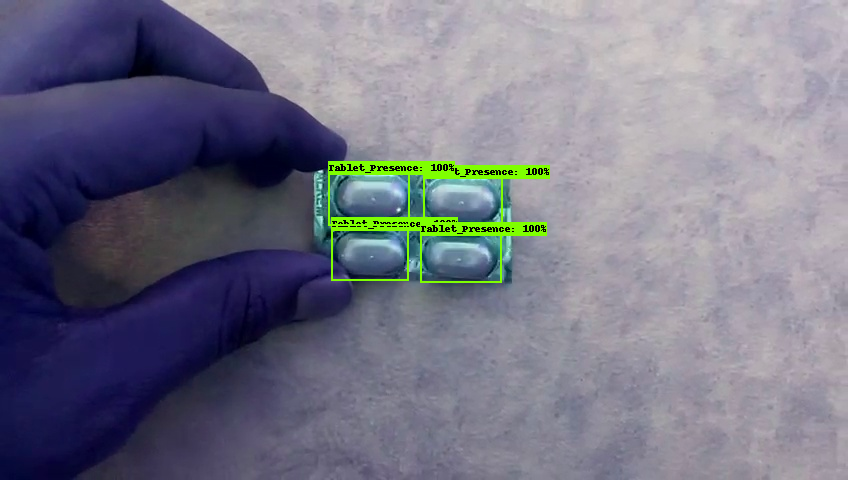

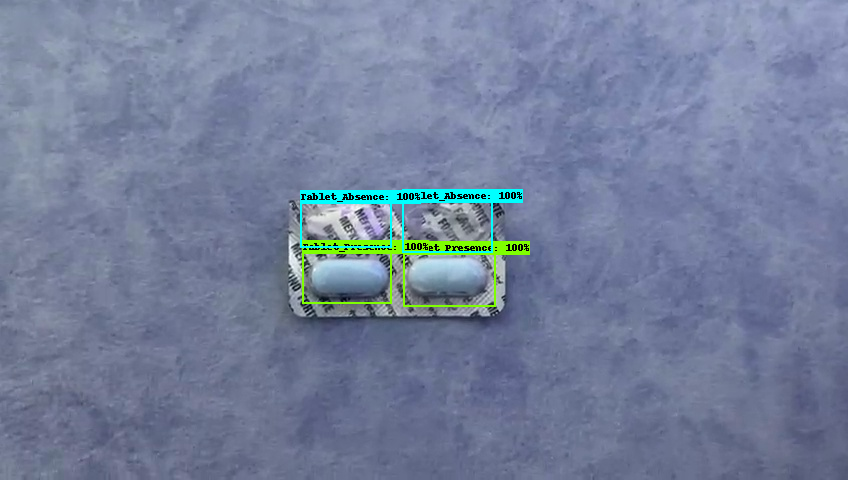

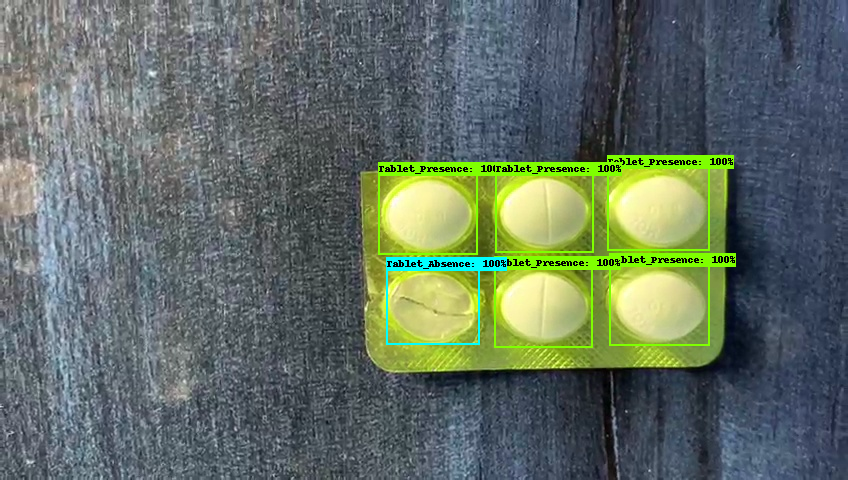

In [63]:
import numpy as np
import argparse
import tensorflow as tf
import cv2
import pathlib
import os
import glob
import sys

from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

# patch tf1 into `utils.ops`
utils_ops.tf = tf.compat.v1

# Patch the location of gfile
tf.gfile = tf.io.gfile

cwd = os.getcwd()

# model_name = os.path.join(cwd,"inference_graph","saved_model")  #model name
model_name = "/content/gdrive/MyDrive/Tensorflow2_Model/models_tf24/research/object_detection/inference_graph_12k/inference_graph_12k/saved_model/"
# # labelmap = os.path.join(cwd,'training2','labelmap.pbtxt') #labelmap
labelmap = "/content/gdrive/MyDrive/Tensorflow2_Model/models_tf24/research/object_detection/training/label_map.pbtxt"

# VIDEO_NAME = 'batch_67.mp4'


# cap = cv2.VideoCapture(VIDEO_NAME)  #pass the video


category_index = label_map_util.create_category_index_from_labelmap(labelmap, use_display_name=True)

def load_model(model_path):
    model = tf.saved_model.load(model_path)
    return model

detection_model = load_model(model_name)



def run_inference_for_single_image(model, image):
    image = np.asarray(image)
    # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
    input_tensor = tf.convert_to_tensor(image)
    # The model expects a batch of images, so add an axis with `tf.newaxis`.
    input_tensor = input_tensor[tf.newaxis,...]
    
    # Run inference
    output_dict = model(input_tensor)

    # All outputs are batches tensors.
    # Convert to numpy arrays, and take index [0] to remove the batch dimension.
    # We're only interested in the first num_detections.
    num_detections = int(output_dict.pop('num_detections'))
    output_dict = {key: value[0, :num_detections].numpy()
                   for key, value in output_dict.items()}
    output_dict['num_detections'] = num_detections

    # detection_classes should be ints.
    output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)
   
    # Handle models with masks:
    if 'detection_masks' in output_dict:
        # Reframe the the bbox mask to the image size.
        detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
                                    output_dict['detection_masks'], output_dict['detection_boxes'],
                                    image.shape[0], image.shape[1])      
        detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5, tf.uint8)
        output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()
    
    return output_dict

def run_inference(model, category_index):
	for imgs in glob.glob("/content/gdrive/MyDrive/Tensorflow2_Model/models_tf24/research/object_detection/test_images_unseen/*.jpg"):
	    image_np = cv2.imread(imgs)
	    # image_np = cv2.resize(image_np, (600, 1024))
	    # Actual detection.
	    output_dict = run_inference_for_single_image(model, image_np)
	    # Visualization of the results of a detection.
	    vis_util.visualize_boxes_and_labels_on_image_array(
	        image_np,
	        output_dict['detection_boxes'],
	        output_dict['detection_classes'],
	        output_dict['detection_scores'],
	        category_index,
	        instance_masks=output_dict.get('detection_masks_reframed', None),
	        use_normalized_coordinates=True,
	        line_thickness=2,
	        min_score_thresh=0.95)
	    display(Image.fromarray(image_np))
	    # cv2.imshow('object_detection', image_np)
	    cv2.imwrite("/content/gdrive/MyDrive/Tensorflow2_Model/models_tf24/research/object_detection/test_results/" + imgs.split("/")[-1],image_np)
	    # if cv2.waitKey(25) & 0xFF == ord('q'):
	    #     # cap.release()
	    #     cv2.destroyAllWindows()
	    #     break

# if __name__ == '__main__':
#     parser = argparse.ArgumentParser(description='Detect objects inside webcam videostream')
#     parser.add_argument('-m', '--model', type=str, required=True, help='Model Path')
#     parser.add_argument('-l', '--labelmap', type=str, required=True, help='Path to Labelmap')
#     args = parser.parse_args()

# detection_model = load_model(args.model)
# category_index = label_map_util.create_category_index_from_labelmap(args.labelmap, use_display_name=True)

# cap = cv2.VideoCapture(0)
run_inference(detection_model, category_index)